## 売上などの数値予測モデル構築

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 94, 94, 64)        1792      
                                                                 
 batch_normalization_63 (Ba  (None, 94, 94, 64)        256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_67 (MaxPooli  (None, 47, 47, 64)        0         
 ng2D)                                                           
                                                                 
 conv2 (Conv2D)              (None, 45, 45, 128)       73856     
                                                                 
 batch_normalization_64 (Ba  (None, 45, 45, 128)       512       
 tchNormalization)                                               
                                                     

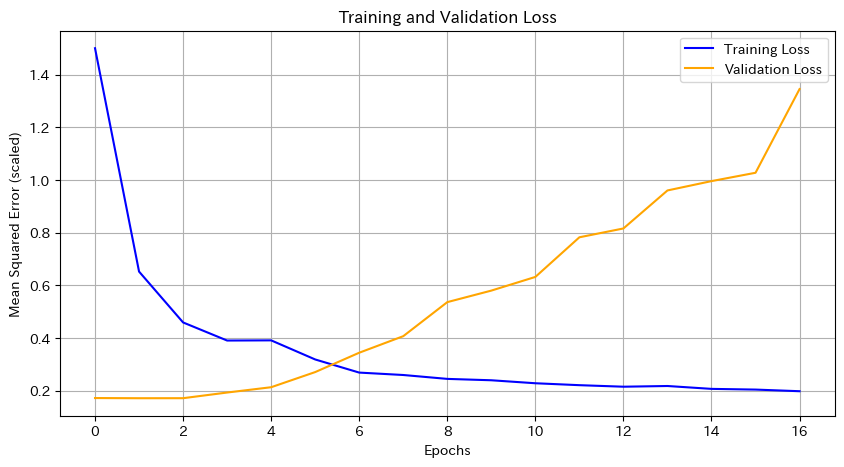

5/5 [==============================] - 0s 25ms/step
Mean Absolute Error: 2655.0607247978296


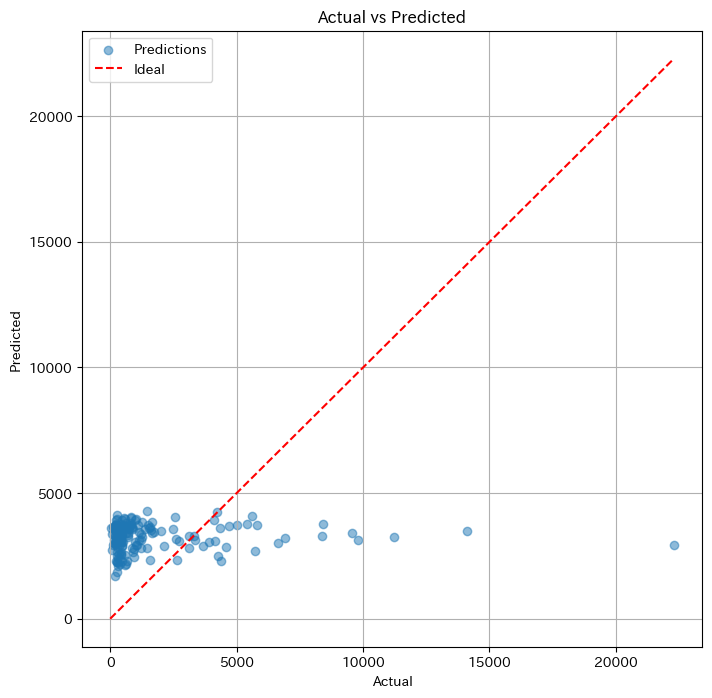

Actual: 240.15, Predicted: 3034.43
Actual: 193.56, Predicted: 3569.05
Actual: 5591.43, Predicted: 4089.84
Actual: 435.47, Predicted: 2539.09
Actual: 5011.02, Predicted: 3737.76


/home/teacher/.local/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [79]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
from PIL import Image, ImageEnhance
import os
import sqlite3
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# --------------------------------------------------
# 1. データの読み込みと前処理
# --------------------------------------------------

# データセットのパス
dataset_path = './SM_pan.db'  # SQLiteデータベースファイルのパス
folder_path = './resized_picture/panWB/'  # 画像フォルダのパス

# SQLiteデータベースの読み込み
conn = sqlite3.connect(dataset_path)  # SQLiteデータベースに接続
df = pd.read_sql_query("SELECT * FROM panWB", conn)  # テーブル名を指定
conn.close()

# ターゲット変数の定義
y = []
X = []

# 画像データの読み込みと前処理
for index, row in df.iterrows():
    img_path = os.path.join(folder_path, f"{row['No']}.jpg")
    if os.path.exists(img_path):
        img = Image.open(img_path).convert('RGB')
        img = img.resize((96, 96))
        
        # コントラストの調整
        enhancer = ImageEnhance.Contrast(img)
        img = enhancer.enhance(1.5)  # コントラストを1.5倍に調整
        
        img = np.array(img, dtype=np.float32) / 255.0  # 正規化
        X.append(img)
        y.append(row['女性個数 (WB)'])

X = np.array(X)
y = np.array(y).reshape(-1, 1)

# ターゲット変数のスケーリング（MinMaxScalerを使用）
scaler = MinMaxScaler()
y_scaled = scaler.fit_transform(y)  # yを0~1にスケーリング

# --------------------------------------------------
# 2. 訓練データとテストデータの分割
# --------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y_scaled, test_size=0.2, random_state=42
)

# --------------------------------------------------
# 3. モデル定義
#    - Batch Normalization / Dropout の導入例
# --------------------------------------------------
def create_model(input_shape, output_units):
    model = models.Sequential()

    # Conv Block 1
    model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape, name='conv1'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    # Conv Block 2
    model.add(layers.Conv2D(128, (3, 3), activation='relu', name='conv2'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    # Conv Block 3
    model.add(layers.Conv2D(256, (3, 3), activation='relu', name='conv3'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    # Global Average Pooling
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
    model.add(layers.Dropout(0.5))

    # 出力層（回帰なので活性化なし）
    model.add(layers.Dense(output_units))

    return model

# 入力形状と出力ユニット数
input_shape = (96, 96, 3)
output_units = 1  # 予測する数値（女性個数比率）のみ

# モデルの作成
model = create_model(input_shape, output_units)

# --------------------------------------------------
# 4. モデルのコンパイル・学習
#    - EarlyStopping / ReduceLROnPlateau の導入例
# --------------------------------------------------
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.9
)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

model.compile(
    optimizer=optimizer,
    loss='mse'
)

model.summary()

# コールバックの設定
early_stopping = EarlyStopping(
    monitor='val_loss',  # 監視対象をval_lossに設定
    patience=15,         # 15エポック連続で改善がなければ打ち切り
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,    # 学習率を1/10にする
    patience=5,    # 5エポック連続で改善がなければ学習率を下げる
    min_lr=1e-7    # 学習率の下限
)

# データ拡張
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=[0.8, 1.2],
    horizontal_flip=True
)

datagen.fit(X_train)

# トレーニングの実行
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_test, y_test),
    epochs=50,
    callbacks=[early_stopping, reduce_lr]
)

# --------------------------------------------------
# 5. モデルの評価と結果の可視化
# --------------------------------------------------

# テストデータでの評価（MSE）
test_loss = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss (MSE, scaled): {test_loss}")

# 学習曲線の可視化
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error (scaled)')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# 予測
y_pred_scaled = model.predict(X_test)
# スケールを元に戻す
y_pred = scaler.inverse_transform(y_pred_scaled)
y_test_original = scaler.inverse_transform(y_test)
# MAEなど他の指標も計算
mae = mean_absolute_error(y_test_original, y_pred)
print(f"Mean Absolute Error: {mae}")

# 散布図による可視化
plt.figure(figsize=(8, 8))

# データをフラット化
y_test_flat = y_test_original.flatten()
y_pred_flat = y_pred.flatten()

plt.scatter(y_test_flat, y_pred_flat, alpha=0.5, label='Predictions')
plt.plot([0, max(y_test_flat)], [0, max(y_test_flat)], color='red', linestyle='--', label='Ideal')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.legend()
plt.grid(True)
plt.show()

# 予測値と実際の値の比較（最初の5サンプル）
for i in range(5):
    actual = y_test_original[i][0]
    pred = y_pred[i][0]
    print(f"Actual: {actual:.2f}, Predicted: {pred:.2f}")


# モデルの保存
model.save('suchi_model.h5')


In [21]:
pip install openpyxl


Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.3.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# 数値予測テスト実行

1/1 [==============================] - 0s 71ms/step


/tmp/ipykernel_12913/1152278133.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  heatmap_colored = cm.get_cmap(colormap)(heatmap_resized)


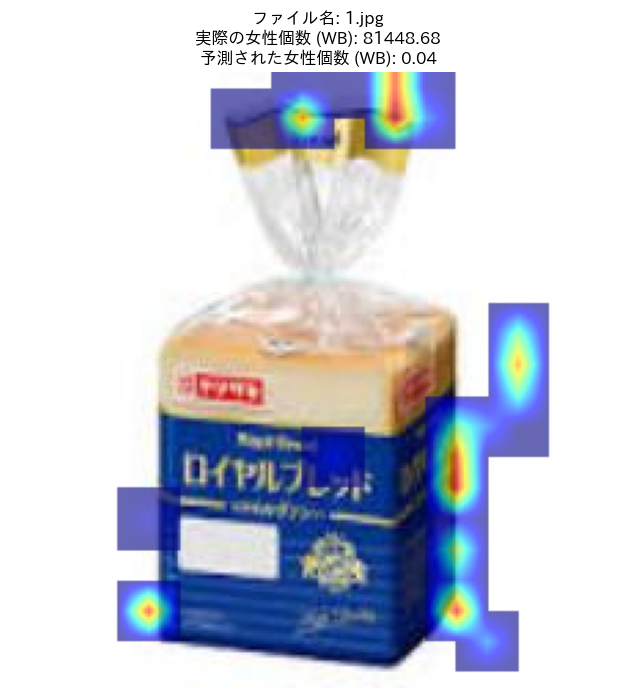

1/1 [==============================] - 0s 17ms/step
画像 2.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 17ms/step


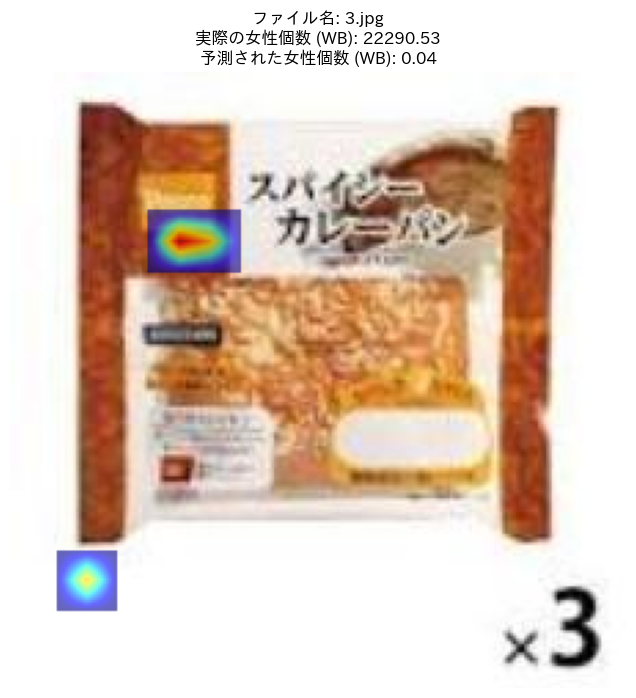

1/1 [==============================] - 0s 17ms/step
画像 4.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 18ms/step


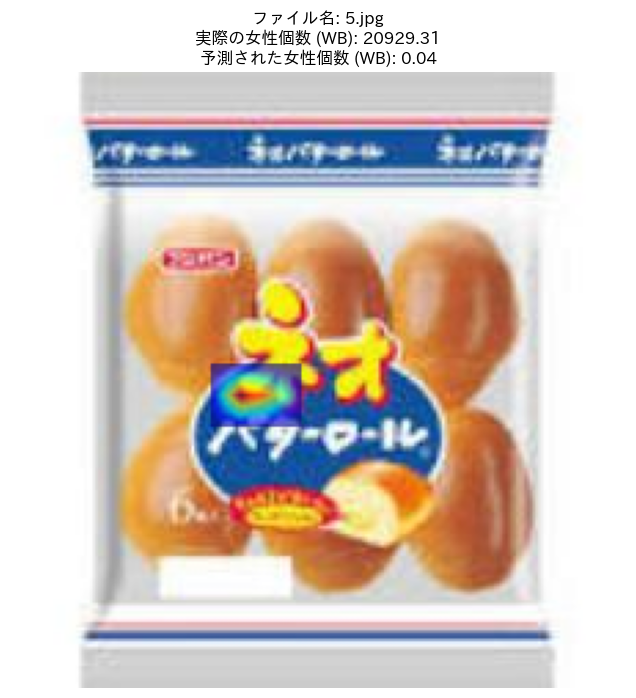

1/1 [==============================] - 0s 18ms/step


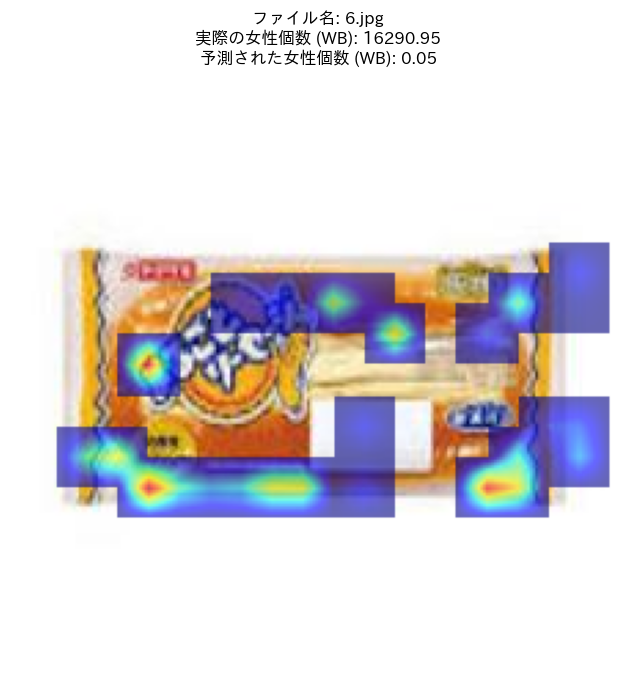

1/1 [==============================] - 0s 18ms/step


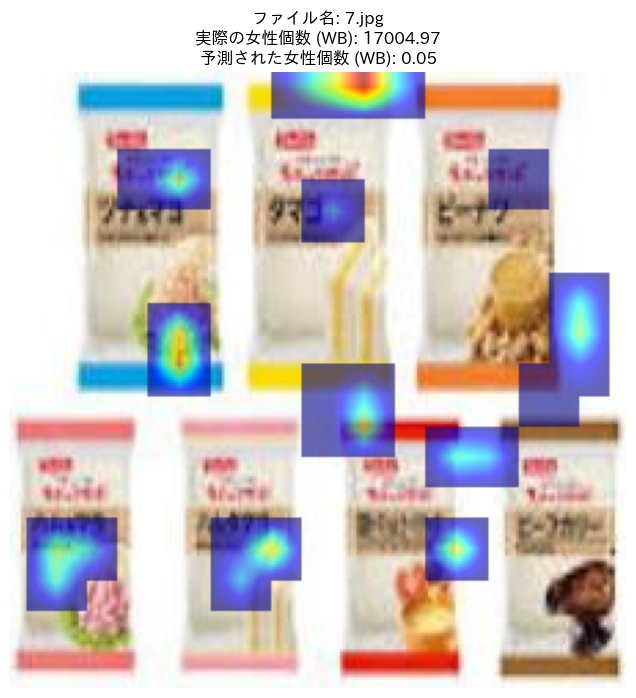

1/1 [==============================] - 0s 18ms/step


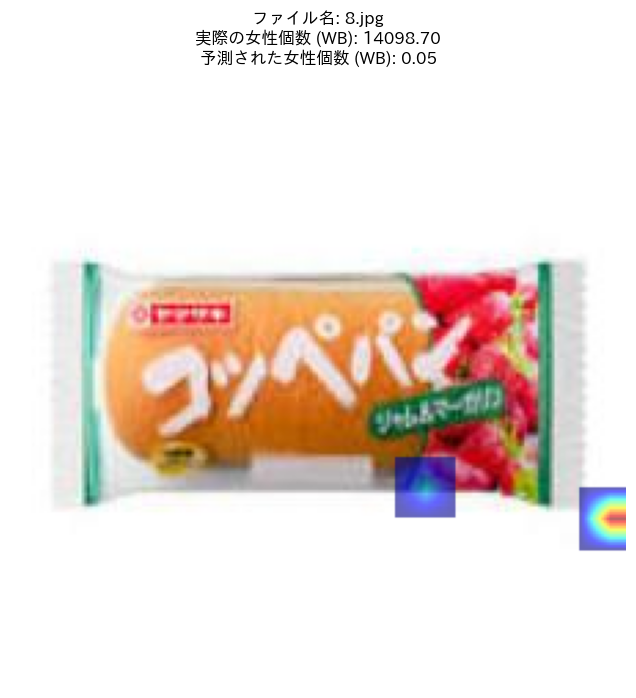

1/1 [==============================] - 0s 20ms/step


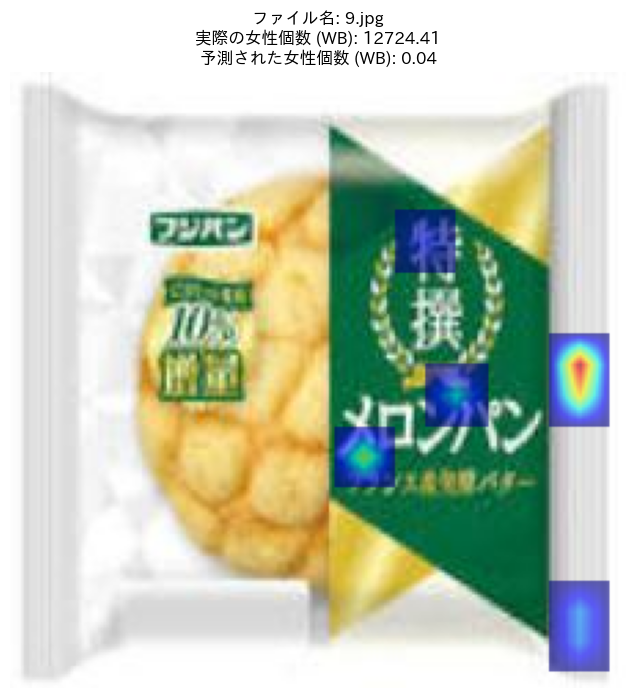

1/1 [==============================] - 0s 18ms/step
画像 10.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 18ms/step


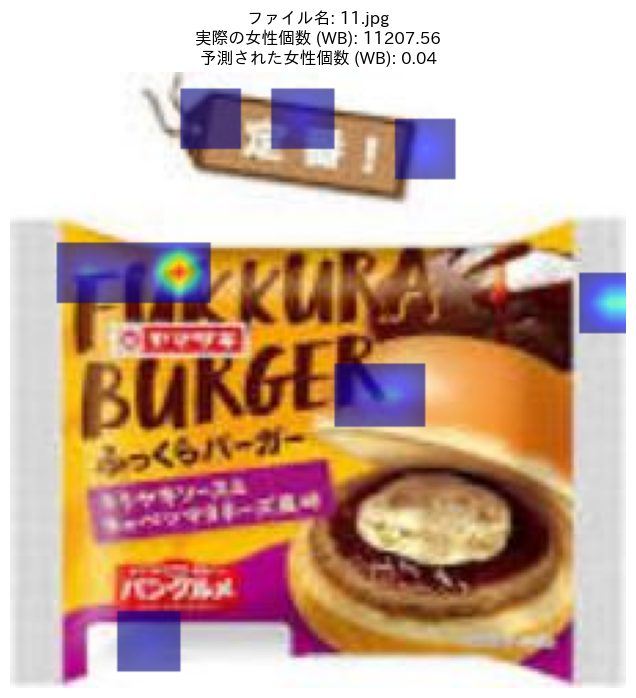

1/1 [==============================] - 0s 17ms/step


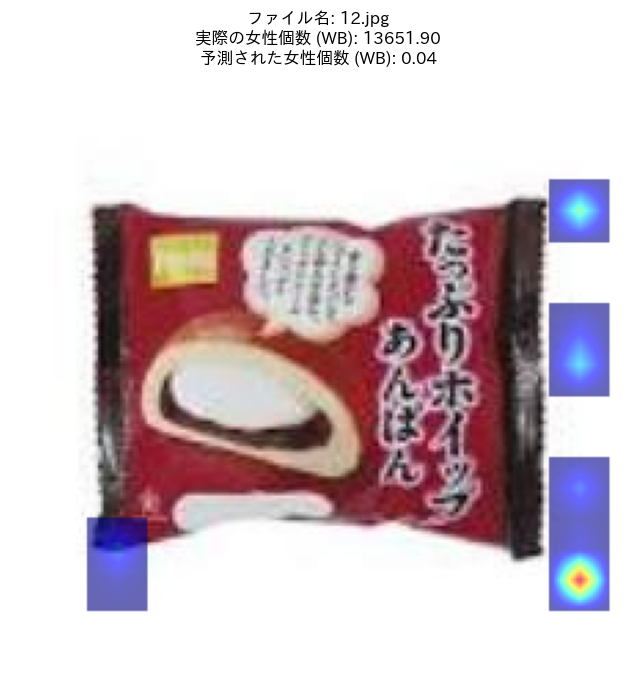

1/1 [==============================] - 0s 17ms/step


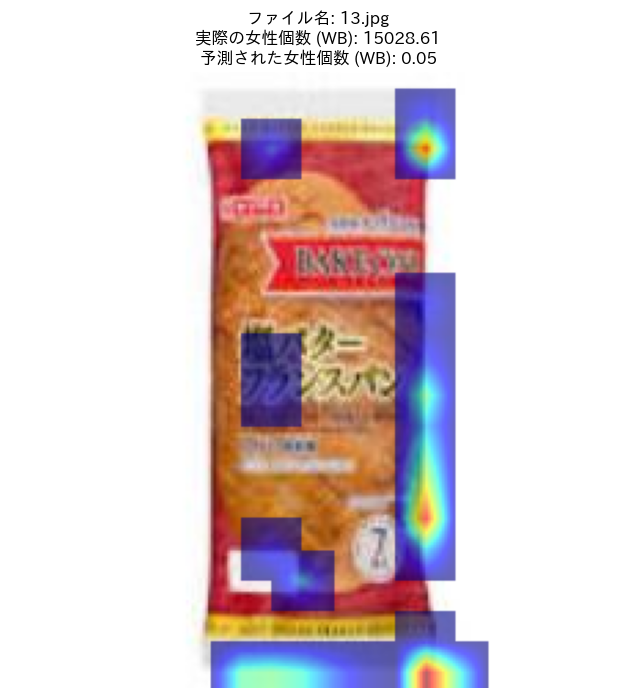

1/1 [==============================] - 0s 18ms/step


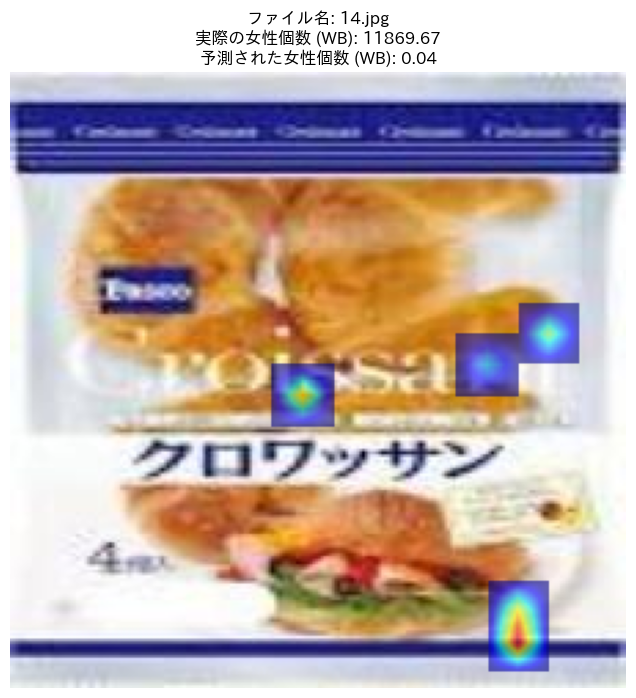

1/1 [==============================] - 0s 17ms/step


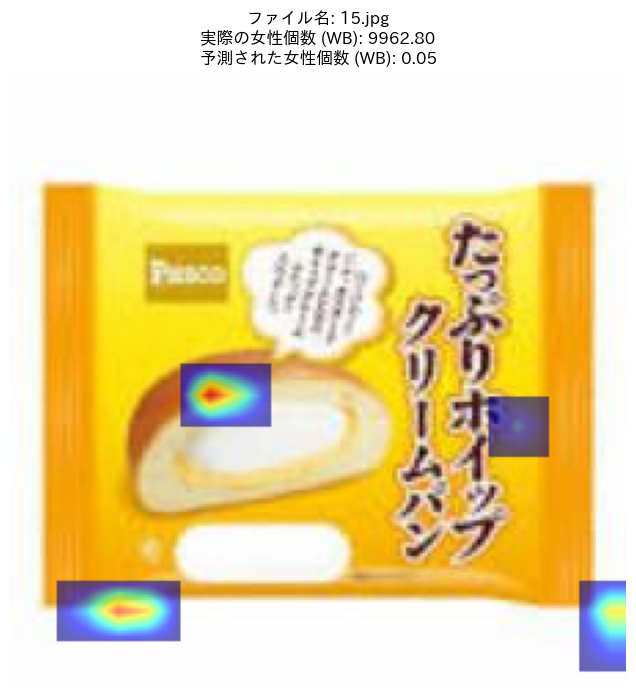

1/1 [==============================] - 0s 19ms/step


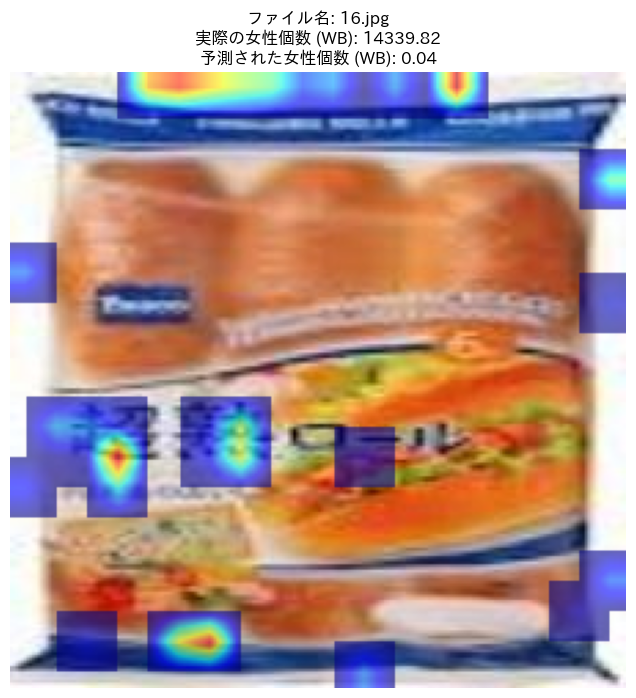

1/1 [==============================] - 0s 17ms/step
画像 17.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 19ms/step


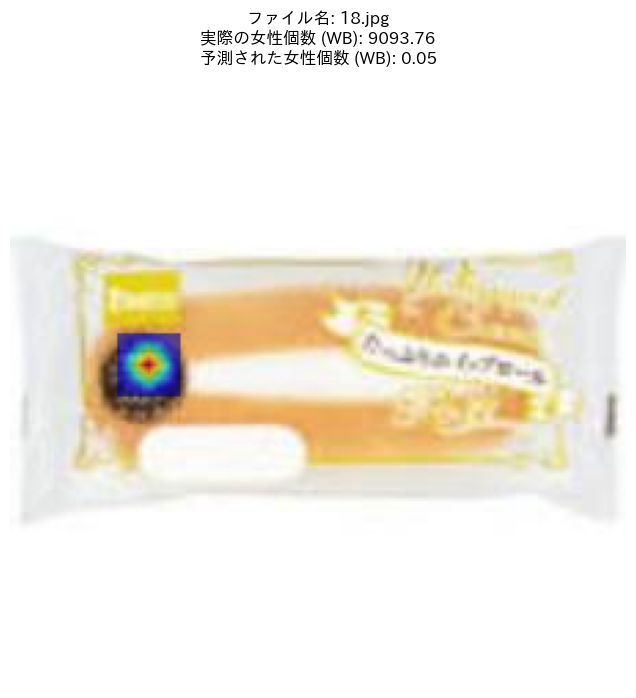

1/1 [==============================] - 0s 17ms/step
画像 19.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 19ms/step


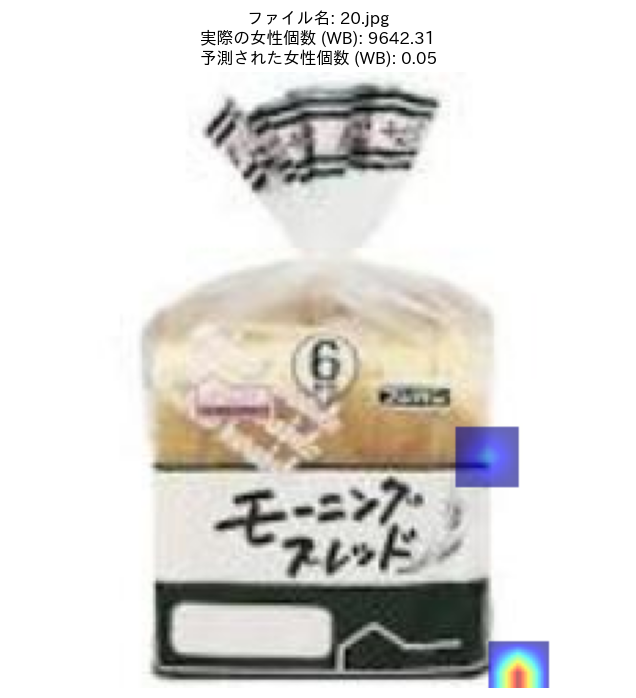

1/1 [==============================] - 0s 17ms/step


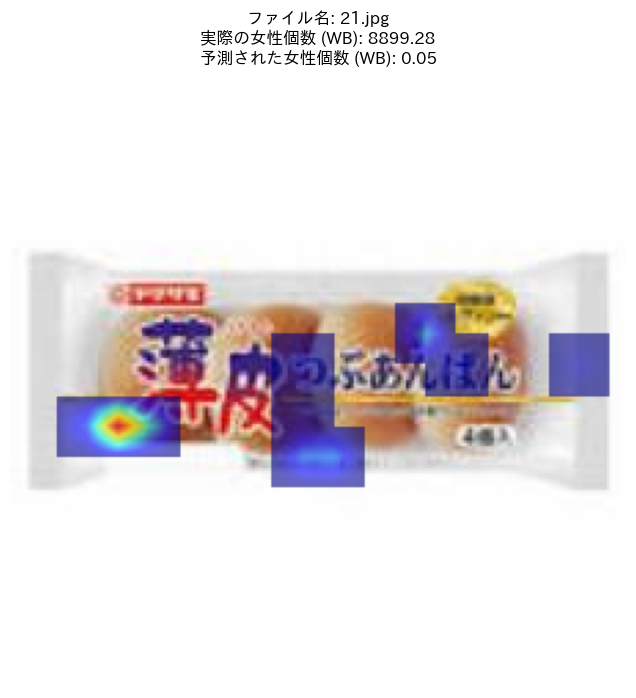

1/1 [==============================] - 0s 17ms/step


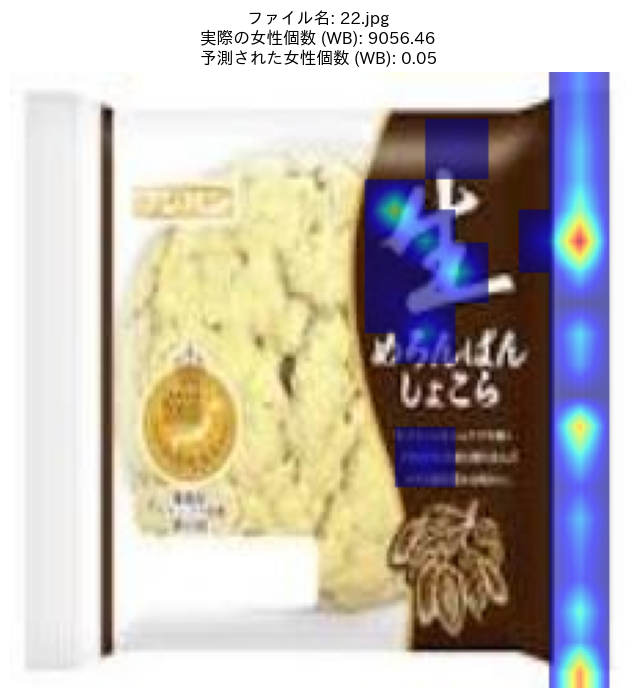

1/1 [==============================] - 0s 17ms/step
画像 23.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 18ms/step


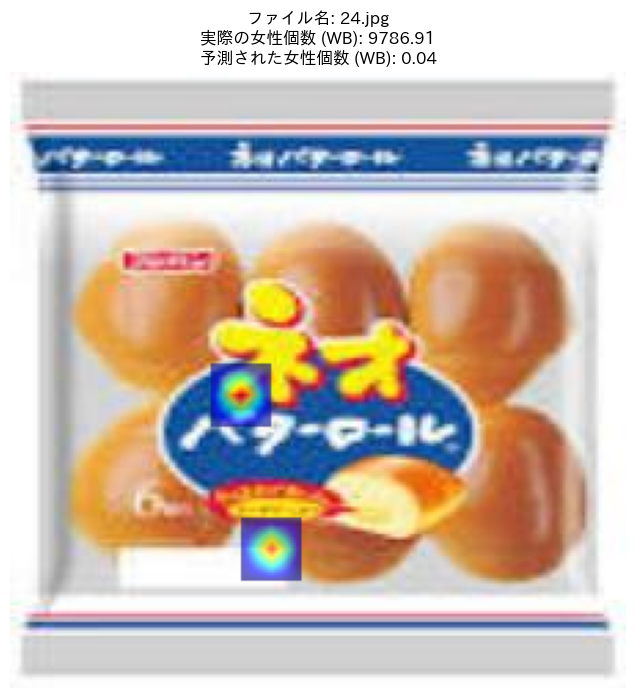

1/1 [==============================] - 0s 18ms/step


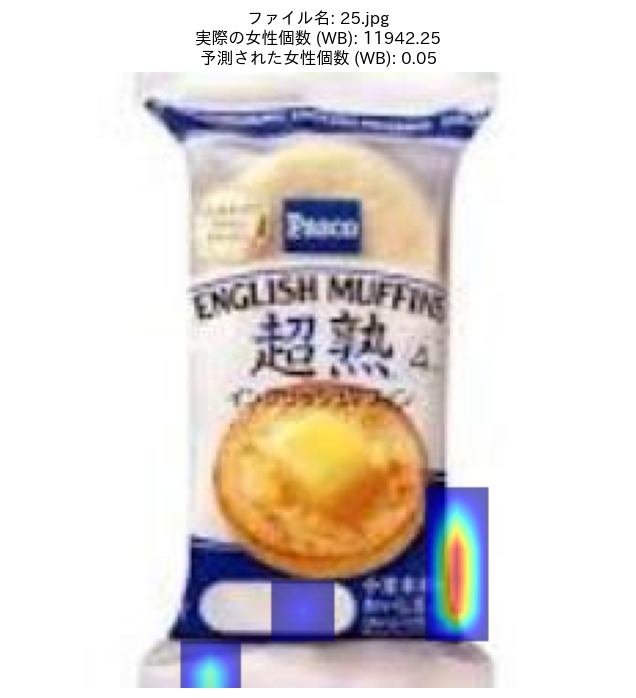

1/1 [==============================] - 0s 17ms/step


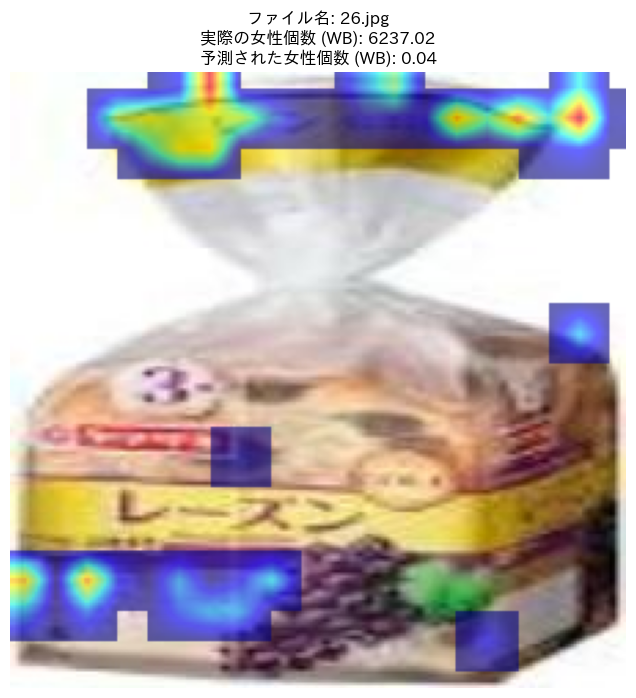

1/1 [==============================] - 0s 17ms/step


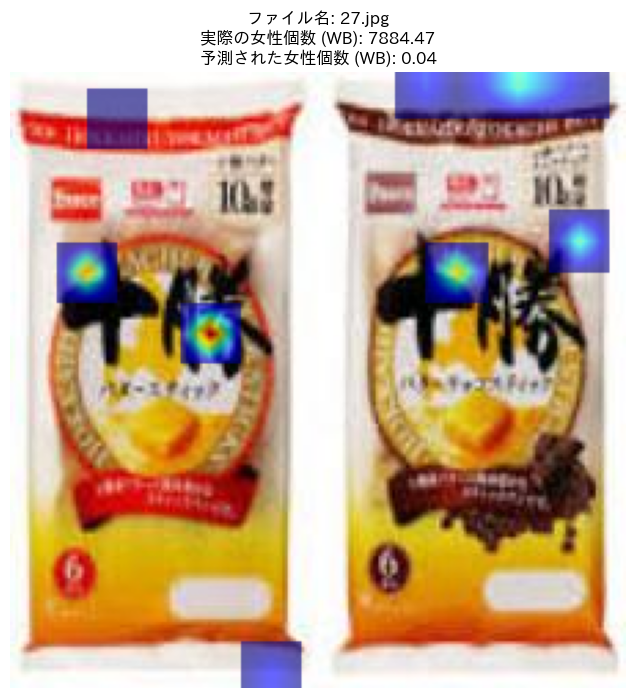

1/1 [==============================] - 0s 17ms/step
画像 28.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 20ms/step


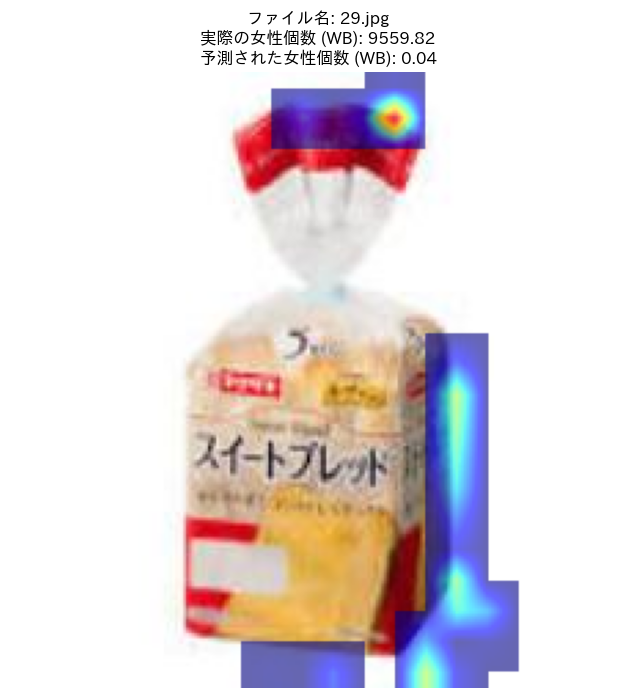

1/1 [==============================] - 0s 17ms/step


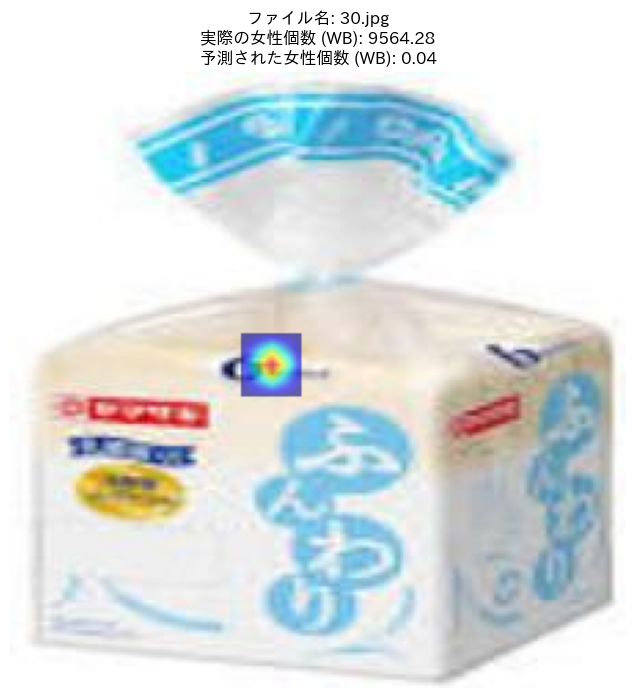

1/1 [==============================] - 0s 17ms/step
画像 31.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 15ms/step


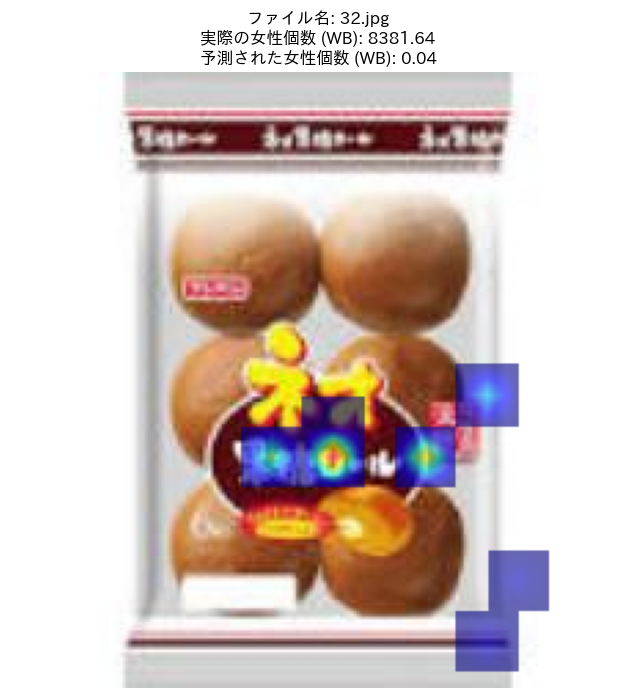

1/1 [==============================] - 0s 17ms/step


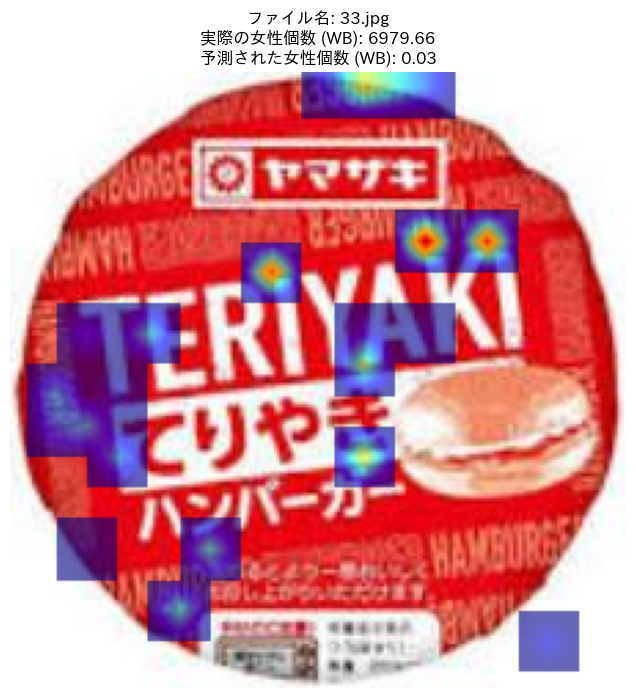

1/1 [==============================] - 0s 17ms/step


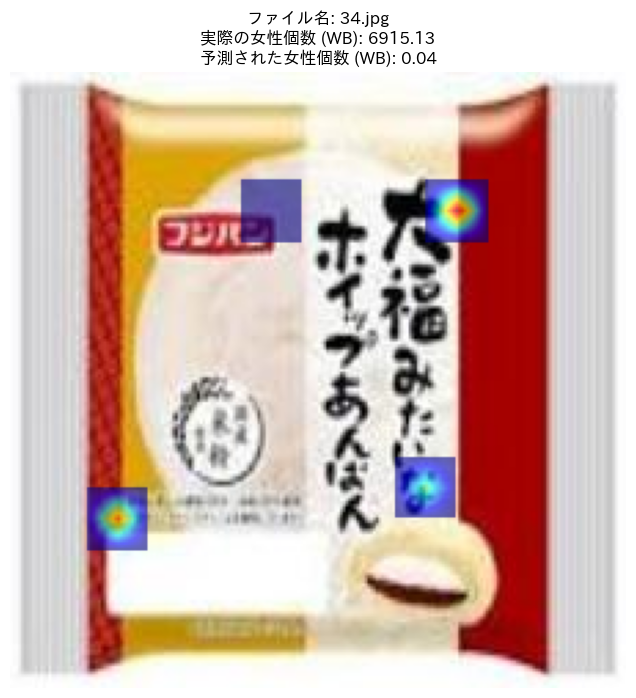

1/1 [==============================] - 0s 17ms/step


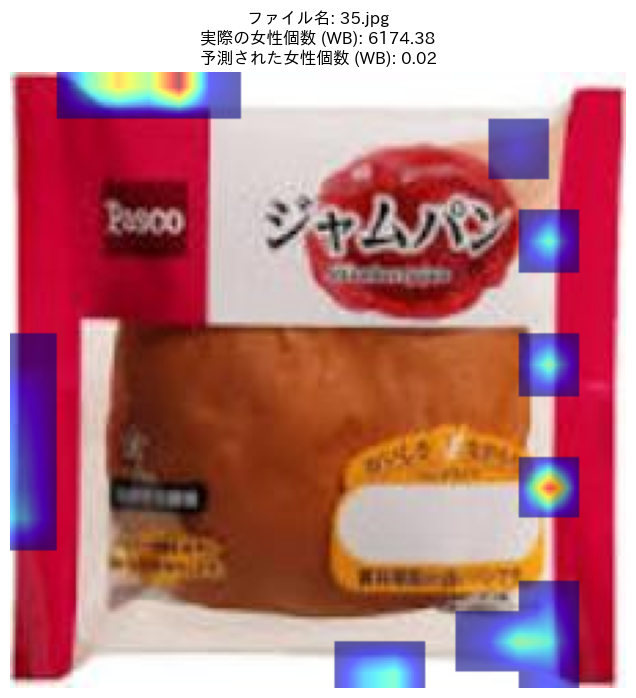

1/1 [==============================] - 0s 21ms/step
画像 36.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 17ms/step
画像 37.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 31ms/step


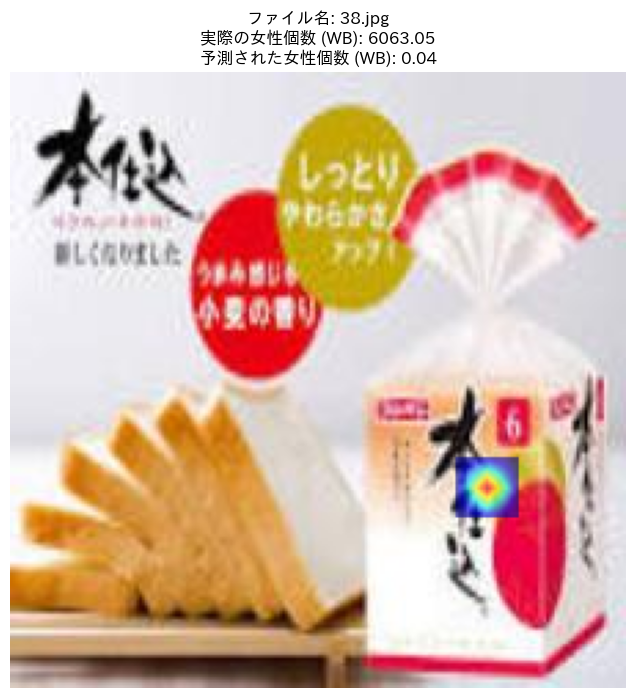

1/1 [==============================] - 0s 17ms/step


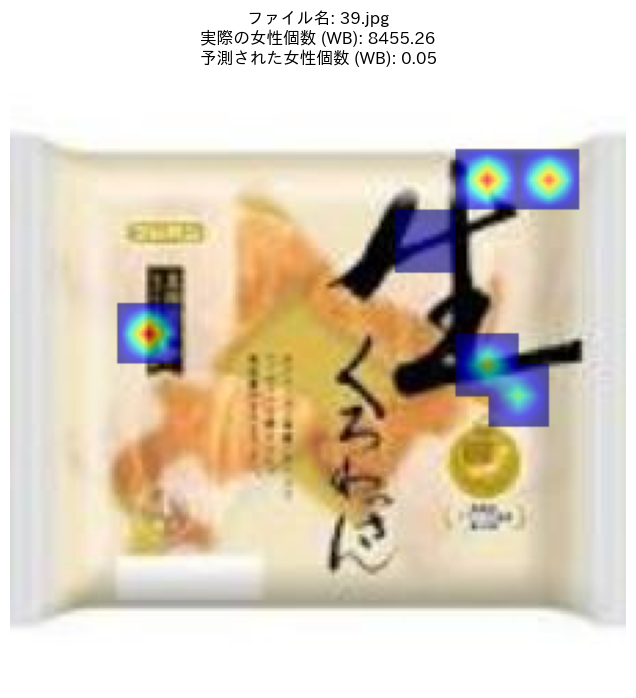

1/1 [==============================] - 0s 17ms/step


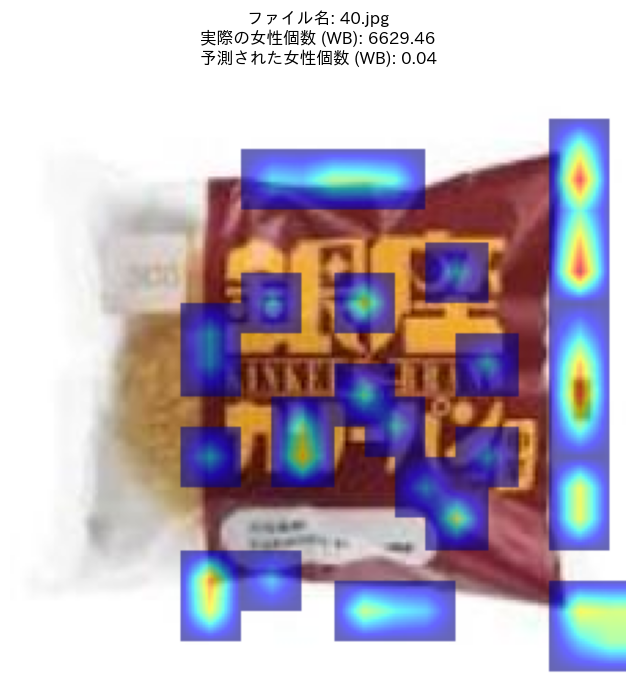

1/1 [==============================] - 0s 24ms/step


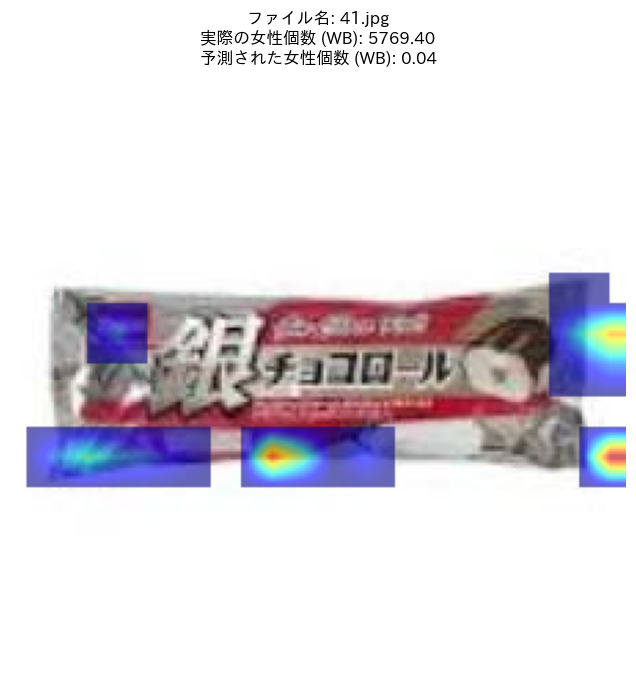

1/1 [==============================] - 0s 22ms/step


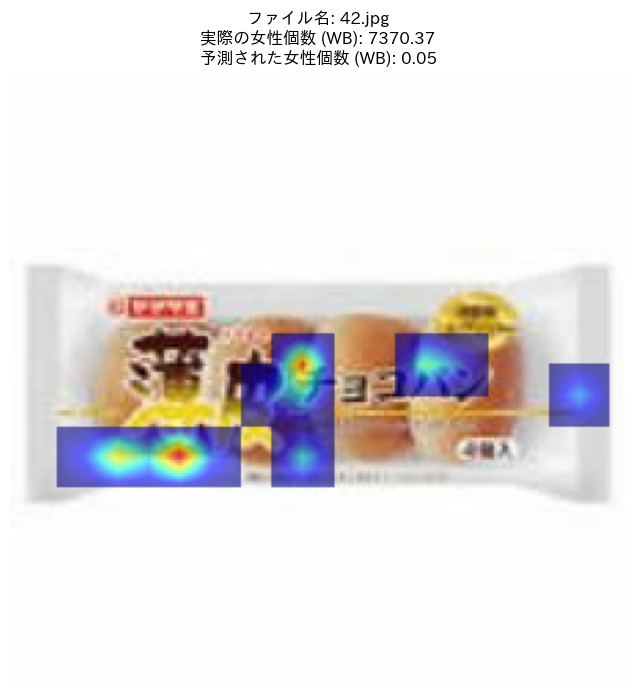

1/1 [==============================] - 0s 22ms/step


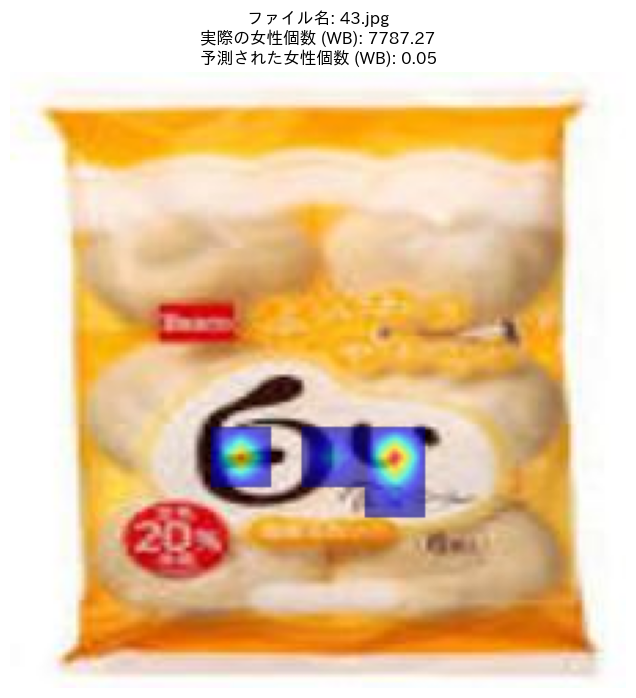

1/1 [==============================] - 0s 25ms/step
画像 44.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 25ms/step


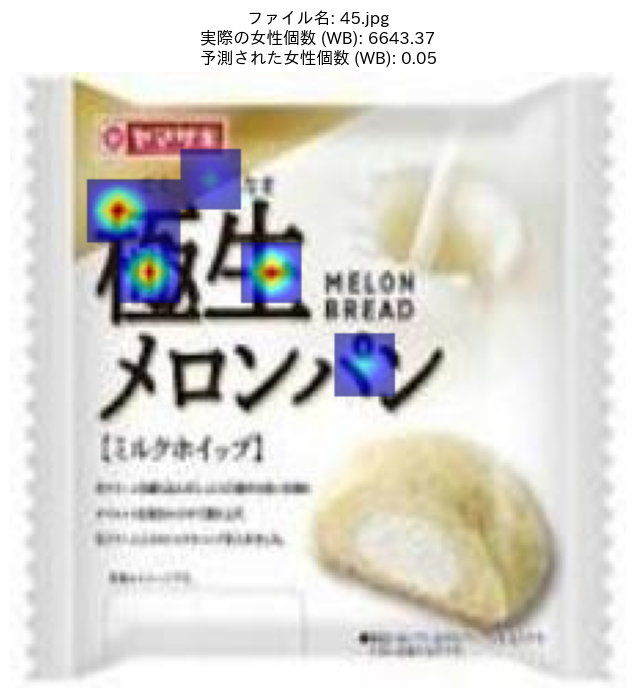

1/1 [==============================] - 0s 23ms/step


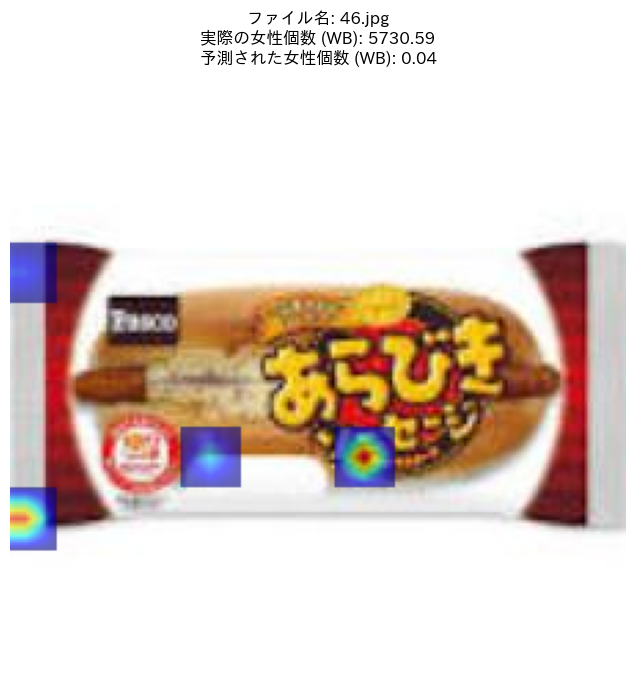

1/1 [==============================] - 0s 22ms/step


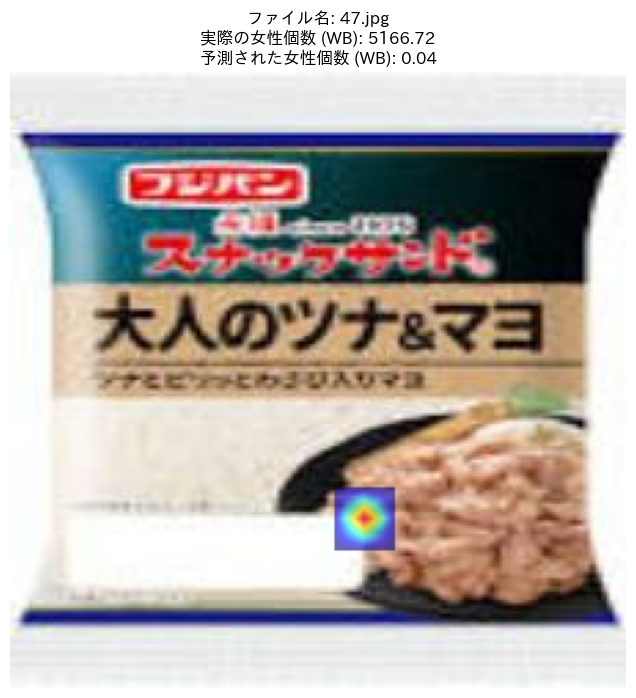

1/1 [==============================] - 0s 23ms/step
画像 48.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 23ms/step


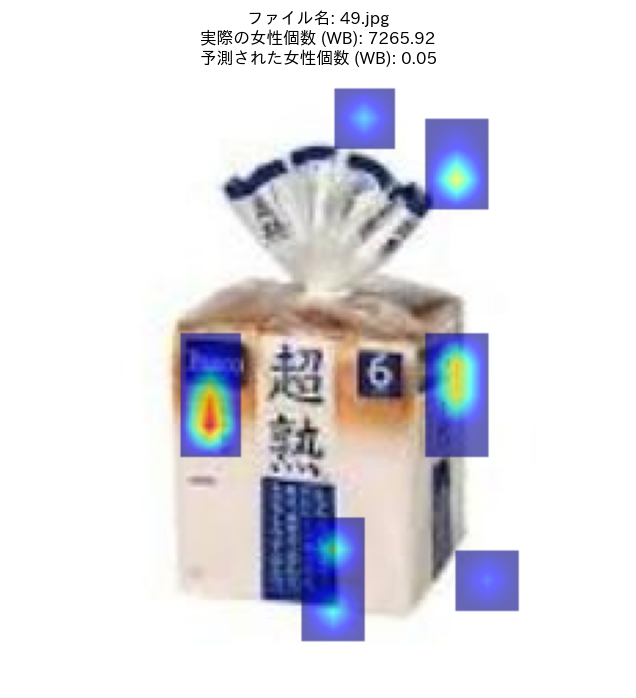

1/1 [==============================] - 0s 22ms/step
画像 50.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 27ms/step


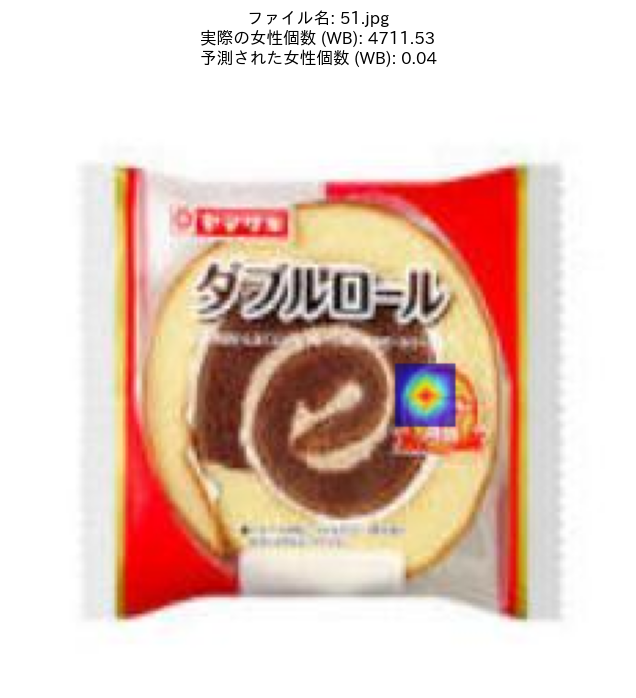

1/1 [==============================] - 0s 23ms/step


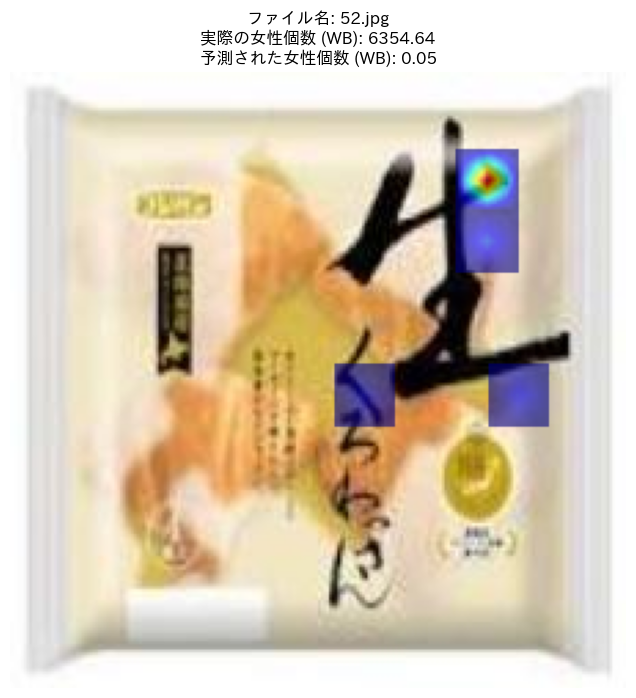

1/1 [==============================] - 0s 22ms/step


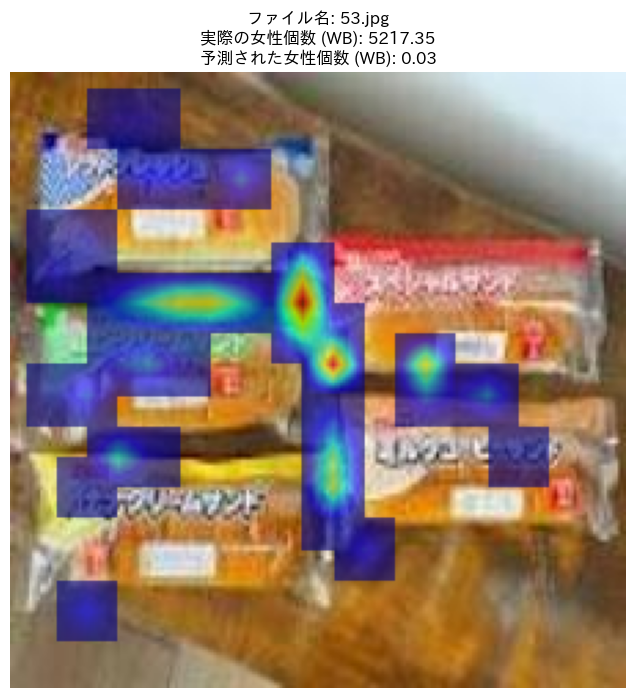

1/1 [==============================] - 0s 22ms/step
画像 54.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 24ms/step


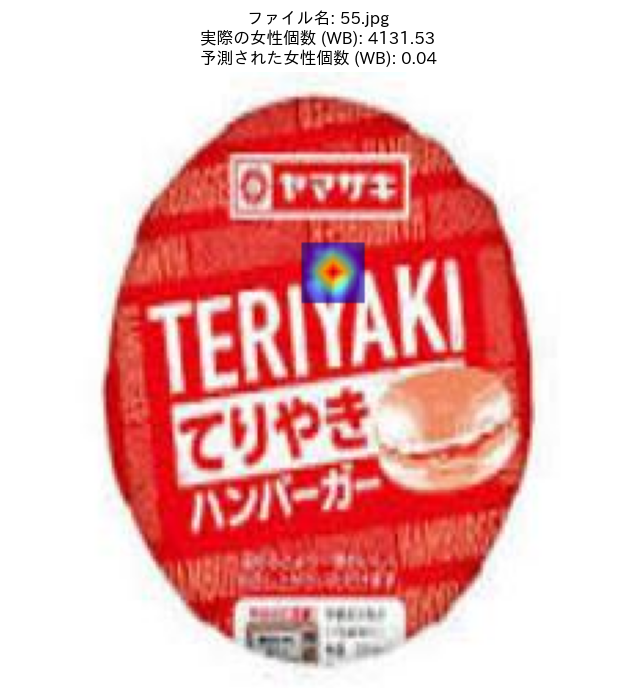

1/1 [==============================] - 0s 23ms/step


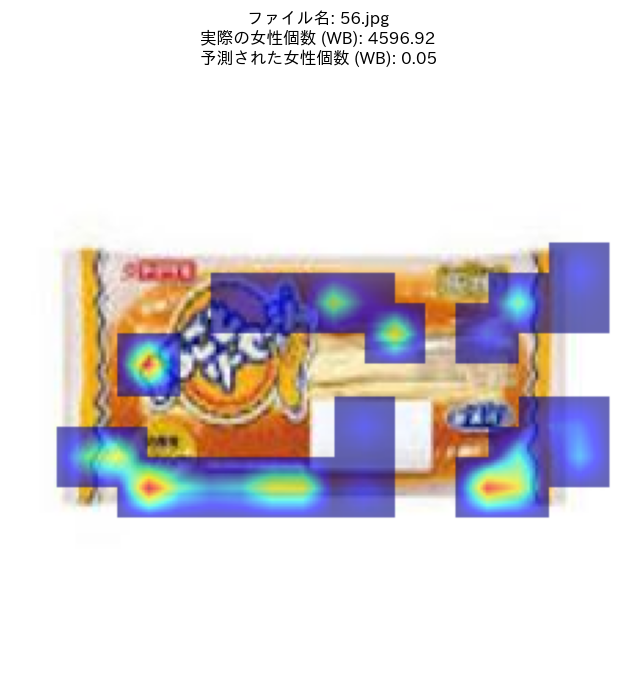

1/1 [==============================] - 0s 22ms/step


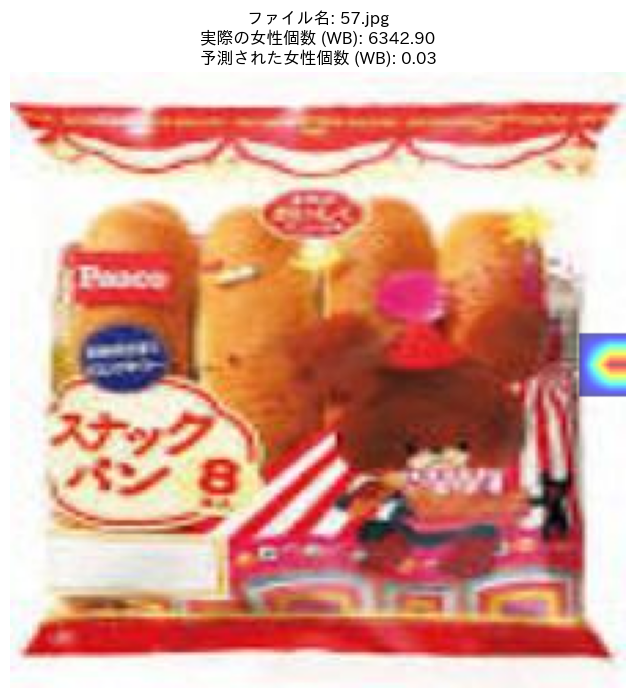

1/1 [==============================] - 0s 21ms/step


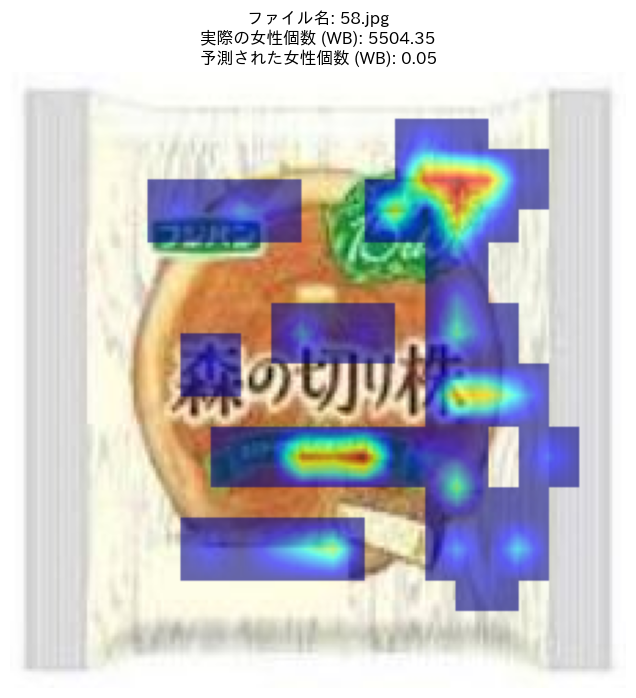

1/1 [==============================] - 0s 22ms/step
画像 59.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 27ms/step


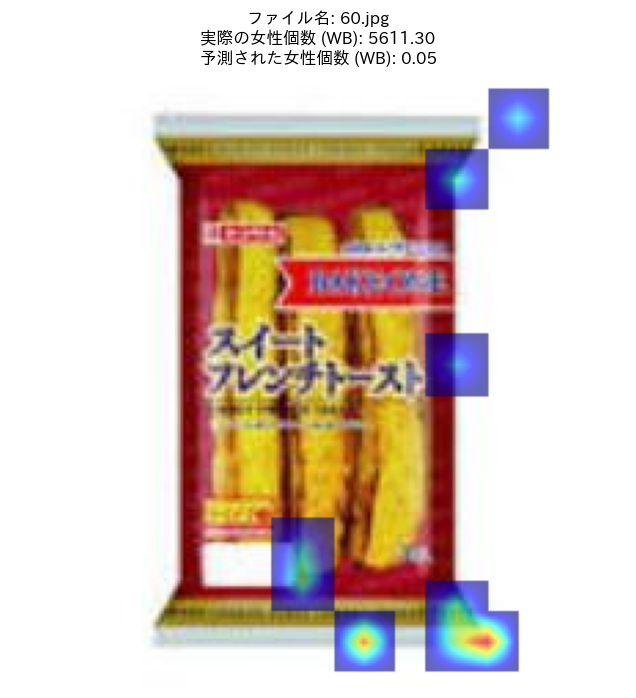

1/1 [==============================] - 0s 22ms/step


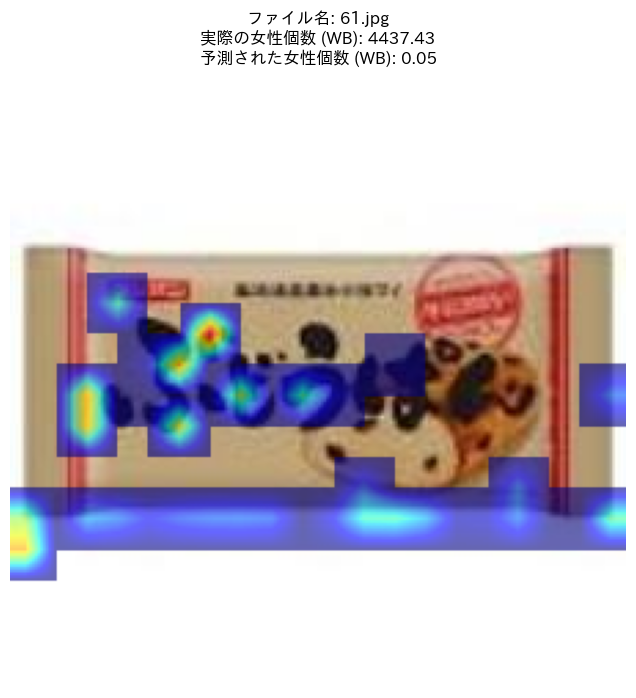

1/1 [==============================] - 0s 19ms/step


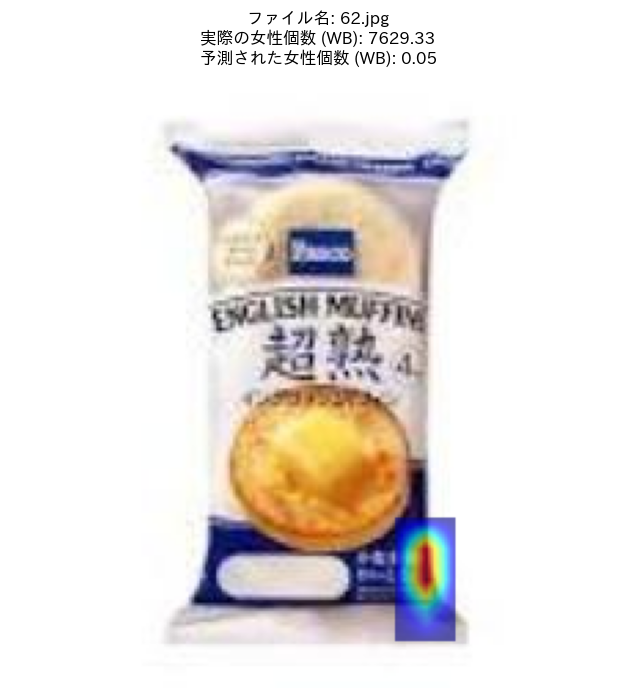

1/1 [==============================] - 0s 21ms/step


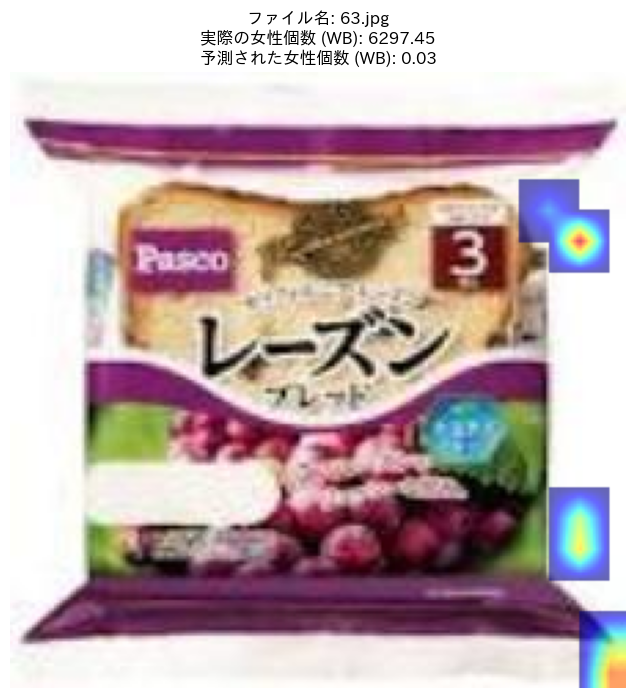

1/1 [==============================] - 0s 22ms/step


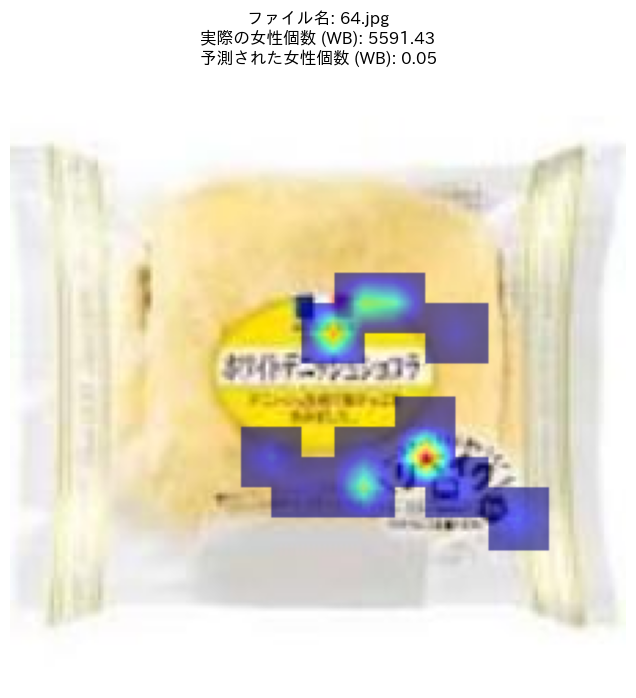

1/1 [==============================] - 0s 22ms/step
画像 65.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 21ms/step
画像 66.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 21ms/step
画像 67.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 25ms/step
画像 68.jpg に対するヒートマップの作成中にエラーが発生しました: 生成されたマスクが空です。ヒートマップの値を確認してください。
1/1 [==============================] - 0s 22ms/step


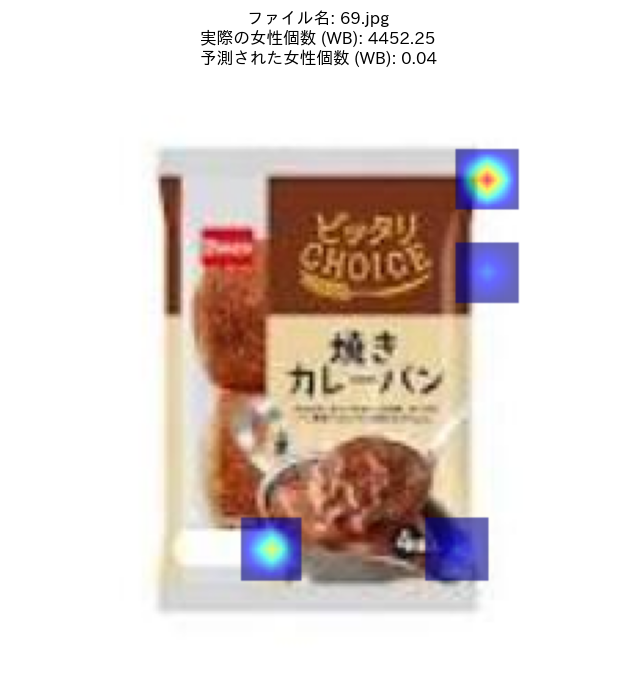

結果が ./prediction_results.xlsx に保存されました。


In [88]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
from PIL import Image
import tensorflow as tf
import os
import pandas as pd
import sqlite3
import openpyxl
import japanize_matplotlib

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, pred_index]
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def emphasize_top_percent(heatmap, percentile=90):
    threshold = np.percentile(heatmap, percentile)
    heatmap_emphasized = np.where(heatmap >= threshold, heatmap, 0)
    if heatmap_emphasized.max() != 0:
        heatmap_emphasized /= heatmap_emphasized.max()
    return heatmap_emphasized

def overlay_heatmap(img_path, heatmap, alpha=0.6, colormap='jet'):
    # 画像の読み込み
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"画像 {img_path} が見つからないか、読み込めませんでした。")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # ヒートマップをリサイズ
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # ヒートマップの色付け
    heatmap_colored = cm.get_cmap(colormap)(heatmap_resized)
    if heatmap_colored is None:
        raise ValueError("ヒートマップの色付けに失敗しました。")

    heatmap_colored = np.uint8(255 * heatmap_colored[:, :, :3])
    mask = heatmap_resized > 0
    if not mask.any():
        raise ValueError("生成されたマスクが空です。ヒートマップの値を確認してください。")

    # ヒートマップを重ね合わせ
    superimposed_img = img.copy()
    superimposed_img[mask] = cv2.addWeighted(img[mask], 1 - alpha, heatmap_colored[mask], alpha, 0)
    return superimposed_img

# モデルの読み込み
model_path = './suchi_model.h5'
model = tf.keras.models.load_model(model_path)

# データベースのパス
database_path = './SM_pan.db'

# 画像フォルダのパス
image_folder_path = './resized_picture/panWBTest/'

# データベースから実際の女性個数比率を取得
conn = sqlite3.connect(database_path)
df = pd.read_sql_query("SELECT No, "'"女性個数 (WB)"'" FROM panWB", conn)
conn.close()

# 結果を保存するリスト
results = []

# モデルの最後の畳み込み層の名前
last_conv_layer_name = 'conv3'

# 画像フォルダ内の全ての画像に対して処理を行う
for filename in os.listdir(image_folder_path):
    if filename.endswith('.jpg'):
        img_path = os.path.join(image_folder_path, filename)

        if not os.path.exists(img_path):
            print(f"画像 {img_path} が存在しません。スキップします。")
            continue

        image = Image.open(img_path).convert('RGB')
        image_resized = image.resize((96, 96))
        img_array = np.array(image_resized, dtype=np.float32) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        # 予測値の取得
        prediction = model.predict(img_array)
        predicted_ratio = prediction[0][0]

        # 実際の女性個数比率をデータベースから取得
        image_no = int(os.path.splitext(filename)[0])
        try:
            actual_ratio = df[df['No'] == image_no]['女性個数 (WB)'].values[0]
        except IndexError:
            print(f"データベースに画像番号 {image_no} のエントリが見つかりませんでした。スキップします。")
            continue

        # Grad-CAMのヒートマップ作成
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=0)
        heatmap_emphasized = emphasize_top_percent(heatmap, percentile=90)

        try:
            superimposed_img = overlay_heatmap(img_path, heatmap_emphasized, alpha=0.6, colormap='jet')
        except Exception as e:
            print(f"画像 {filename} に対するヒートマップの作成中にエラーが発生しました: {e}")
            continue

        # 画像の表示
        plt.figure(figsize=(8, 8))
        plt.imshow(superimposed_img)
        plt.axis('off')
        plt.title(f"ファイル名: {filename}\n実際の女性個数 (WB): {actual_ratio:.2f}\n予測された女性個数 (WB): {predicted_ratio:.2f}")
        plt.show()

        # 結果をリストに追加
        results.append([filename, actual_ratio, predicted_ratio])

# 結果をDataFrameに変換
results_df = pd.DataFrame(results, columns=['ファイル名', '実際の女性個数 (WB)', '予測された女性個数 (WB)'])

# Excelファイルに出力
excel_path = './prediction_results.xlsx'
results_df.to_excel(excel_path, index=False)
print(f"結果が {excel_path} に保存されました。")
